Crop Images
====

Straighten, crop + adjust images to send to Elis

In [1]:
import os

%load_ext autoreload
%autoreload 2

output_dir= "img/cropped/"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [2]:
"""
Choose some images at random

"""

import pathlib
import numpy as np

rng = np.random.default_rng(123)
n_imgs = 30

img_dir = "data/original cut/"

# Choose some images at random
img_paths = rng.choice(
    list(pathlib.Path(img_dir).rglob("*.tif")), n_imgs, replace=False
)

# Get the corresponding masks
mask_paths = [
    pathlib.Path(str(p).replace("original cut", "masks cut")) for p in img_paths
]

for img, mask in zip(img_paths, mask_paths):
    assert img.exists()
    assert mask.exists()

100%|██████████| 30/30 [00:00<00:00, 330.04it/s]


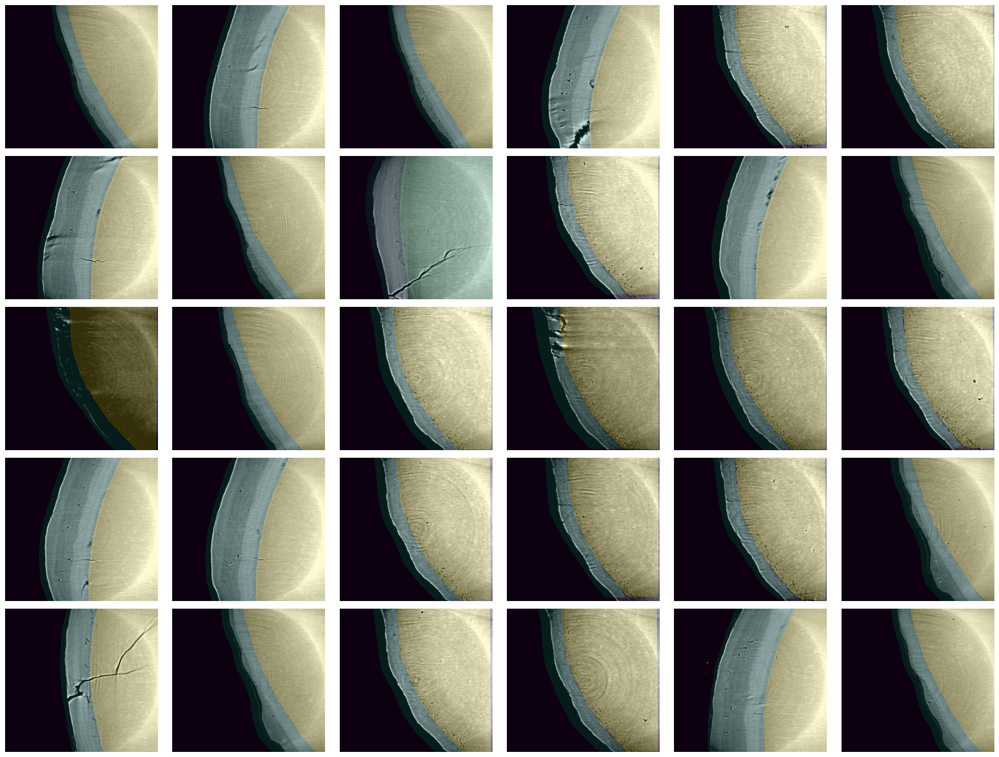

In [3]:
import matplotlib.pyplot as plt
from tqdm import tqdm

n_axes = (5, 6)

fig, axes = plt.subplots(*n_axes, figsize=(20, 15))

images = []
masks = []
for ax, img_path, mask_path in tqdm(
    zip(axes.flat, img_paths, mask_paths), total=n_imgs
):
    image = plt.imread(img_path)
    mask = plt.imread(mask_path)

    images.append(image)
    masks.append(mask)

    ax.imshow(image, cmap="grey")
    ax.imshow(mask, alpha=0.2)
    ax.axis("off")

fig.tight_layout()

100%|██████████| 30/30 [00:00<00:00, 1058.28it/s]


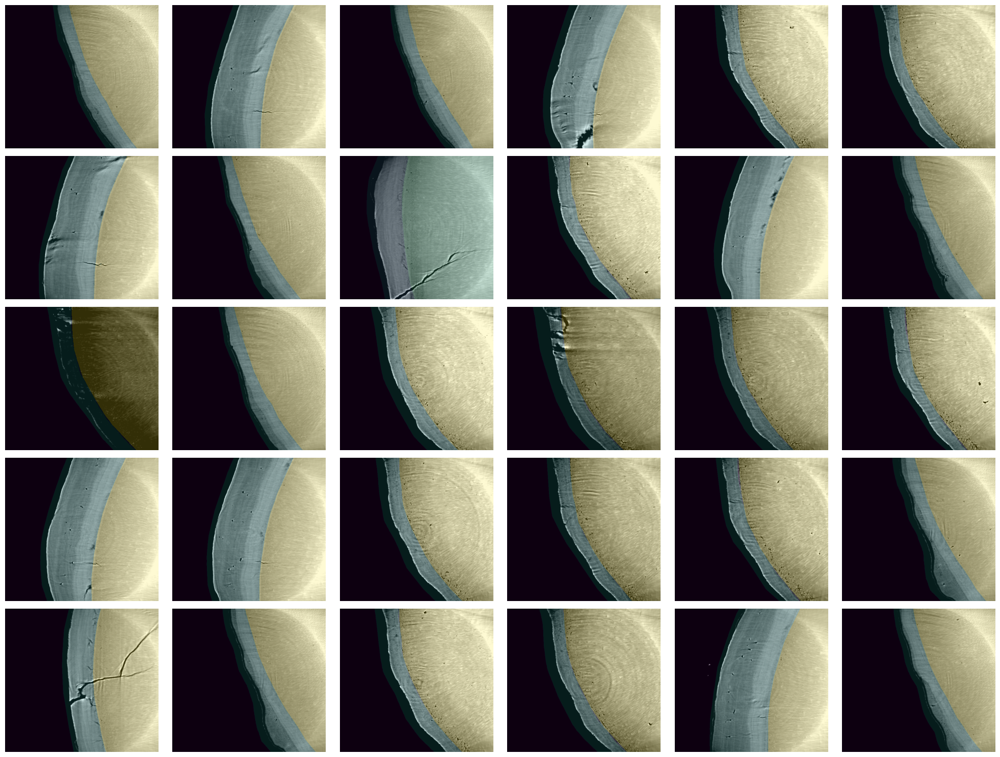

In [4]:
"""
Crop some pixels from the right and bottom since this might make it easier

We need to do this because sometimes the background region in the masks leaks around the image
A better solution would be to deal with this when we correct the mask, but this will do for now

"""

n_crop = 20
images = [img[:-n_crop, :-n_crop] for img in images]
masks = [mask[:-n_crop, :-n_crop] for mask in masks]

fig, axes = plt.subplots(*n_axes, figsize=(20, 15))

for ax, image, mask in tqdm(zip(axes.flat, images, masks), total=n_imgs):
    ax.imshow(image, cmap="grey")
    ax.imshow(mask, alpha=0.2)
    ax.axis("off")

fig.tight_layout()

In [5]:
"""
Save the raw images

"""

raw_dir = f"{output_dir}/raw/"
if not os.path.exists(raw_dir):
    os.mkdir(raw_dir)
for i, img in tqdm(enumerate(images)):
    plt.imsave(f"{raw_dir}{i}.png", img, cmap="gray")

30it [00:01, 24.78it/s]


In [6]:
"""
Correct any of these masks

"""

from cementum import correct_mask

corrected_masks = []
for i, mask in enumerate(masks):
    kernel_size = 5
    while True:
        try:
            corrected_mask = correct_mask.correct_mask(
                mask, kernel_size=kernel_size, verbose=True
            )
            corrected_masks.append(corrected_mask)
            break

        except correct_mask.InvalidMaskError as e:
            if kernel_size > 15:
                raise e
            print(
                f"Failed to correct mask {i} with {kernel_size=}; trying with larger kernel size"
            )
            kernel_size += 3

ERROR:root:Mask is still invalid after correction: All regions in the mask should be contiguous
ERROR:root:Mask is still invalid after correction: All regions in the mask should be contiguous


Failed to correct mask 9 with kernel_size=5; trying with larger kernel size
Failed to correct mask 9 with kernel_size=8; trying with larger kernel size


ERROR:root:Mask is still invalid after correction: All regions in the mask should be contiguous
ERROR:root:Mask is still invalid after correction: All regions in the mask should be contiguous


Failed to correct mask 17 with kernel_size=5; trying with larger kernel size
Failed to correct mask 22 with kernel_size=5; trying with larger kernel size


100%|██████████| 30/30 [00:00<00:00, 303.11it/s]


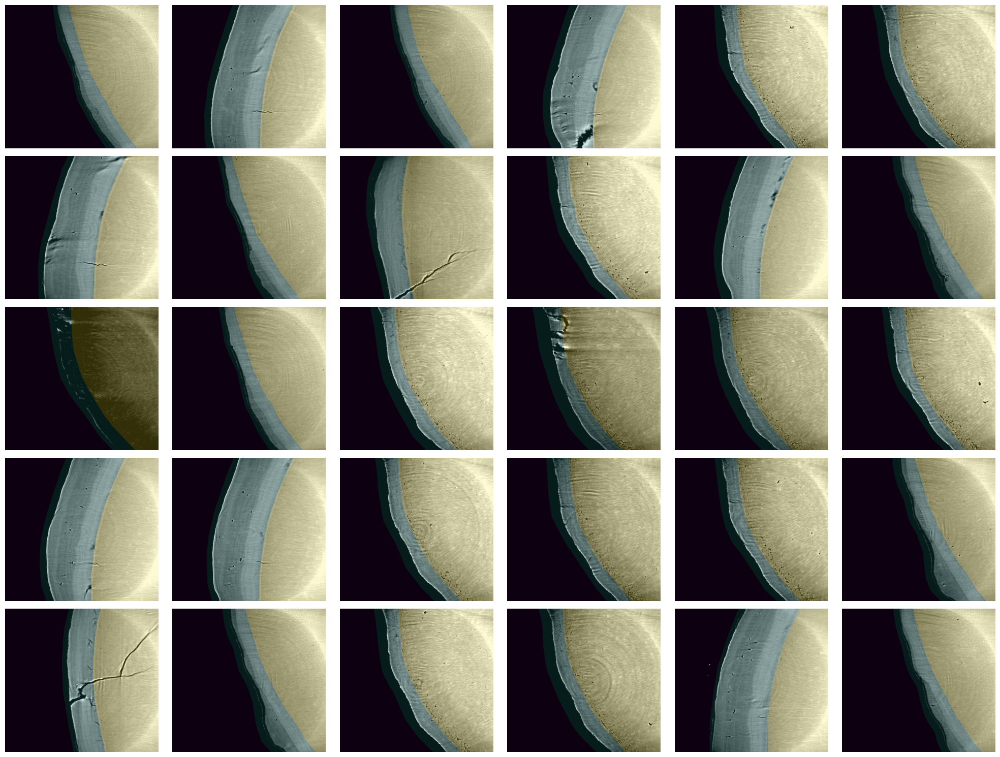

In [7]:
fig, axes = plt.subplots(*n_axes, figsize=(20, 15))

for ax, image, mask in tqdm(zip(axes.flat, images, corrected_masks), total=n_imgs):

    ax.imshow(image, cmap="grey")
    ax.imshow(mask, alpha=0.2)
    ax.axis("off")

fig.tight_layout()

In [13]:
"""
Create meshes for straightening

"""

from cementum import straighten

n_y = 50
n_x = 5, 5, 5

curved_meshes = []
straight_meshes = []

for i, mask in tqdm(enumerate(corrected_masks)):
    curved_mesh = straighten.mask_mesh(mask, n_y, n_x)
    curved_meshes.append(curved_mesh)

    straight_mesh = straighten.straight_mesh(mask, n_y, n_x)
    straight_meshes.append(straight_mesh)

30it [00:00, 31.30it/s]


In [19]:
straight_images = []

for image, curve_mesh, straight_mesh in tqdm(
    zip(images, curved_meshes, straight_meshes), total=len(images)
):
    straight_image = straighten.apply_transformation(image, curve_mesh, straight_mesh)
    straight_images.append(straight_image)

100%|██████████| 30/30 [00:58<00:00,  1.95s/it]


In [20]:
straight_images = [straighten.remove_white_cols(image, image)[0] for image in straight_images]
straight_images = [straighten.remove_padding(image) for image in straight_images]

/home/mh19137/cementum/cementum/straighten.py:531: UserWarning: Temporary solution: removing 72 saturated columns from right
  warnings.warn(
/home/mh19137/cementum/cementum/straighten.py:531: UserWarning: Temporary solution: removing 22 saturated columns from right
  warnings.warn(
/home/mh19137/cementum/cementum/straighten.py:531: UserWarning: Temporary solution: removing 27 saturated columns from right
  warnings.warn(
/home/mh19137/cementum/cementum/straighten.py:531: UserWarning: Temporary solution: removing 70 saturated columns from right
  warnings.warn(
/home/mh19137/cementum/cementum/straighten.py:531: UserWarning: Temporary solution: removing 23 saturated columns from right
  warnings.warn(
/home/mh19137/cementum/cementum/straighten.py:531: UserWarning: Temporary solution: removing 68 saturated columns from right
  warnings.warn(
/home/mh19137/cementum/cementum/straighten.py:531: UserWarning: Temporary solution: removing 10 saturated columns from right
  warnings.warn(
/home/

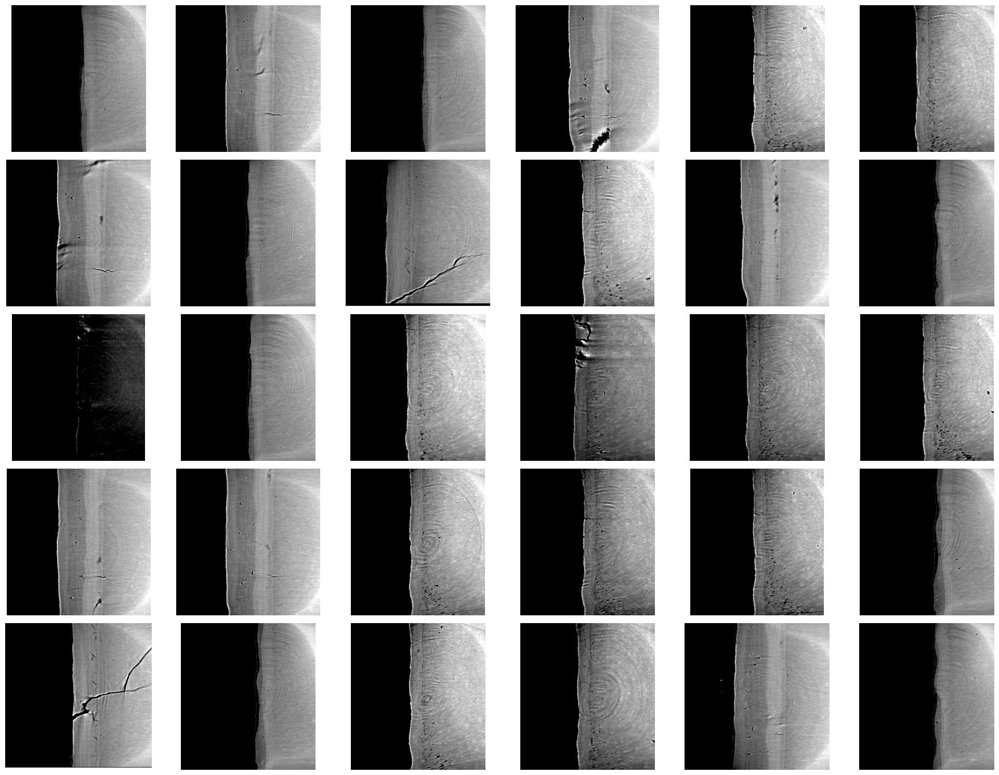

In [21]:
fig, axes = plt.subplots(*n_axes, figsize=(20, 15))

for axis, straight_image in zip(axes.flat, straight_images):
    axis.imshow(straight_image, cmap="grey")
    axis.set_axis_off()

fig.tight_layout()

In [22]:
"""
Save the straight images

"""

straight_dir = f"{output_dir}straight/"
if not os.path.exists(straight_dir):
    os.mkdir(straight_dir)
for i, img in tqdm(enumerate(straight_images)):
    plt.imsave(f"{straight_dir}{i}.png", img, cmap="gray")

0it [00:00, ?it/s]

30it [00:01, 27.69it/s]


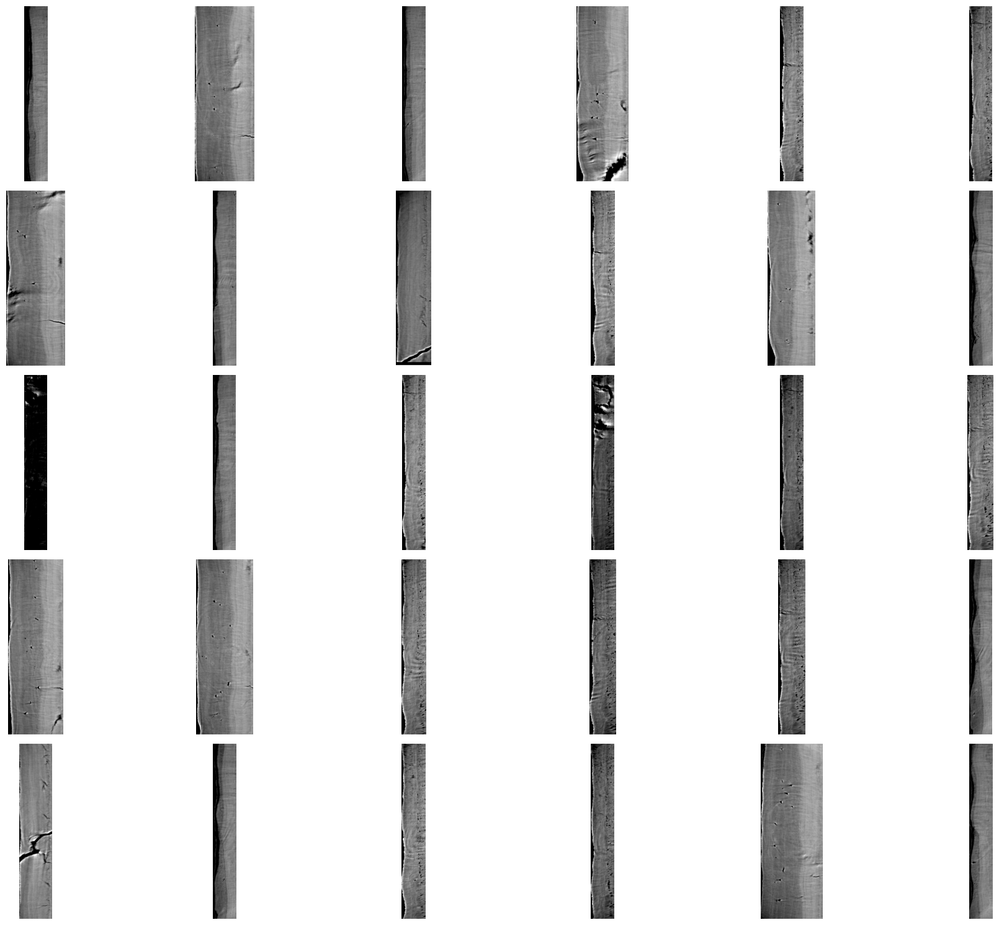

In [30]:
"""
Read in the images I've cropped by hand

"""

cropped_images = [plt.imread(f"{output_dir}/cropped/{i}.png") for i in range(n_imgs)]
fig, axes = plt.subplots(*n_axes, figsize=(20, 15))

for axis, cropped_image in zip(axes.flat, cropped_images):
    axis.imshow(cropped_image, cmap="grey")
    axis.set_axis_off()

fig.tight_layout()